<>:6: SyntaxWarning: invalid escape sequence '\O'
<>:6: SyntaxWarning: invalid escape sequence '\O'
C:\Users\14926\AppData\Local\Temp\ipykernel_9696\2525567918.py:6: SyntaxWarning: invalid escape sequence '\O'
  img = cv2.imread('.\OIP.jpg')


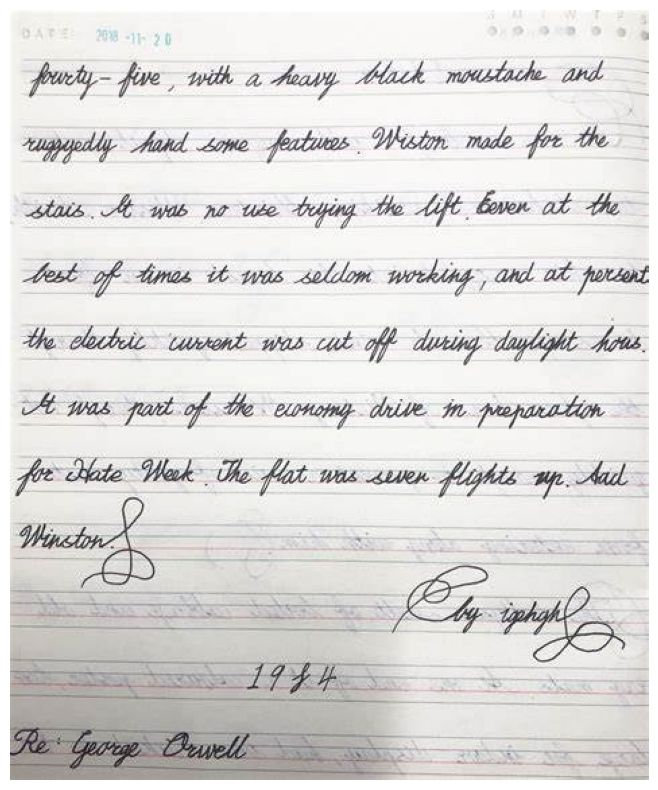

In [15]:
import pytesseract
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.figure(figsize=(10,10),dpi=100)
img = cv2.imread('.\OIP.jpg')
img_rgb = img[:, :, ::-1]
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract'
pytesseract.pytesseract.tesseract_cmd = tesseract_cmd

In [16]:
# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# noise removal 中值滤波
def remove_noise(image):
    return cv2.medianBlur(image,5)

#thresholding 二值化
def thresholding(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
def thresgh(image):
    return cv2.adaptiveThreshold(image,)
#dilation 卷积核膨胀
def dilate(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.dilate(image, kernel, iterations = 1)

#erosion 腐蚀
def erode(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.erode(image, kernel, iterations = 1)

#opening - erosion followed by dilation
def opening(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

#canny edge detection
def canny(image):
    return cv2.Canny(image, 100, 200)

def gaussian(image):
    return cv2.GaussianBlur(image,(5,5),0)

def blur(image):
    return cv2.blur(image,(5,5))

def bilateral(image):
    return cv2.bilateralFilter(image, 9, 75, 75)

def sobel(image):  
    dst1= cv2.Sobel(image,cv2.CV_64F,1,0,ksize=3)
    dst2= cv2.Sobel(image,cv2.CV_64F,0,1,ksize=3)
    combined_grad_clipped = np.clip(cv2.add(dst1,dst2), 0, np.max(cv2.add(dst1,dst2)) )
    combined_grad_normalized = (combined_grad_clipped / np.max(combined_grad_clipped) * 255).astype(np.uint8)
    return combined_grad_normalized

def scharr(image):
    dst1 = cv2.Scharr(image,cv2.CV_64F,1,0)
    dst2 = cv2.Scharr(image,cv2.CV_64F,0,1)
    return cv2.add(dst1,dst2)

def laplacian(image):
    return cv2.Laplacian(image,cv2.CV_64F,ksize=5)

def showimg(image):
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
  #  plt.show()
    

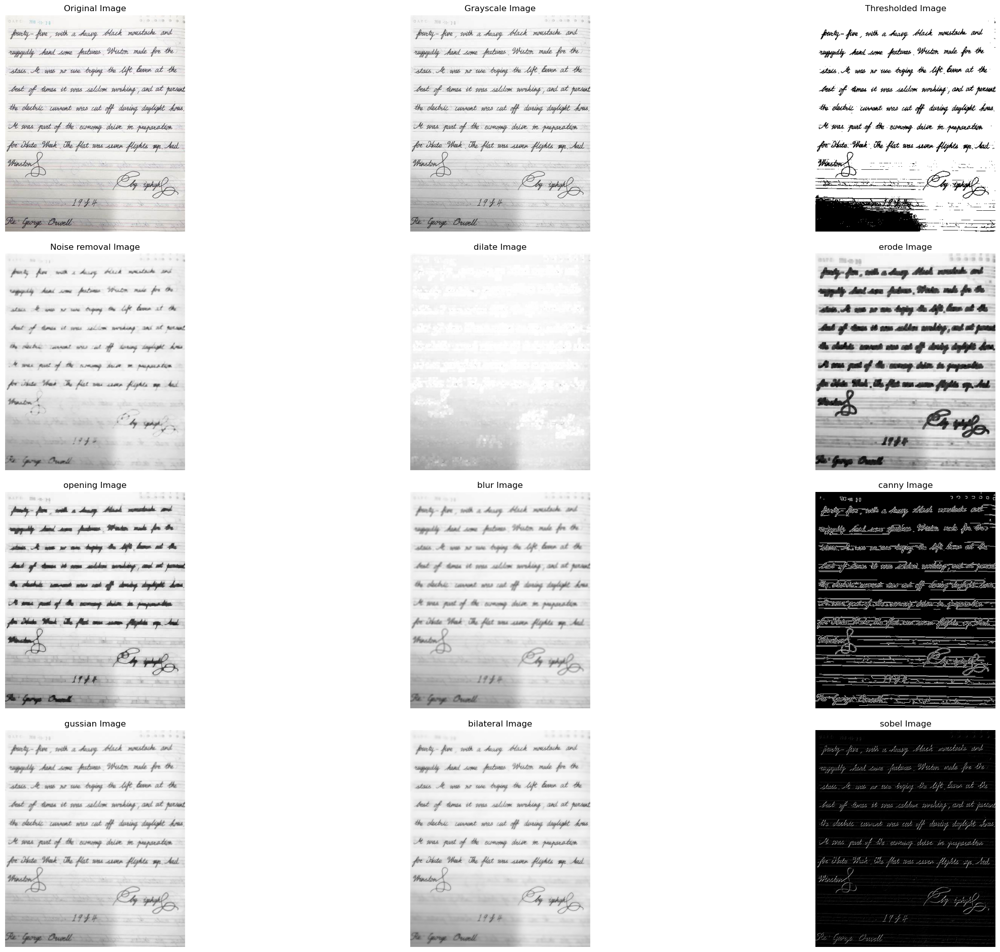

In [17]:
plt.figure(figsize=(30,30))
plt.subplot(531)
plt.title('Original Image')
showimg(img)

plt.subplot(532)
plt.title('Grayscale Image')
img_gray = get_grayscale(img)
showimg(img_gray)

plt.subplot(533)
plt.title('Thresholded Image')
img_thresh = thresholding(img_gray)
showimg(img_thresh)

plt.subplot(534)
plt.title('Noise removal Image')
img_median = remove_noise(img_gray)
showimg(img_median)

plt.subplot(535)
plt.title('dilate Image')
showimg(dilate(img_gray))

plt.subplot(536)
plt.title('erode Image')
showimg(erode(img_gray))

plt.subplot(537)
plt.title('opening Image')
showimg(opening(img_gray))

plt.subplot(538)
plt.title('blur Image')
showimg(blur(img_gray))

plt.subplot(539)
plt.title('canny Image')
showimg(canny(img_gray))

plt.subplot(5,3,10)
plt.title('gussian Image')
showimg(gaussian(img_gray))

plt.subplot(5,3,11)
plt.title('bilateral Image')
showimg(bilateral(img_gray))

plt.subplot(5,3,12)
plt.title('sobel Image')
showimg(sobel(img_gray))
plt.axis('off')

plt.subplots_adjust(hspace=0.1,wspace=0.1) 
plt.show()

In [18]:
#
from PIL import ImageFont, ImageDraw, Image
from pytesseract import Output
def drawbox(image):
    custom_config = r'--oem 3 --psm 6'  
    d = pytesseract.image_to_data(image, output_type=Output.DICT, config=custom_config)
    n_boxes = len(d['level'])
    for i in range(n_boxes):
       (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
       text = d['text'][i]
       if text.strip() != '':
        image_boxes = cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    return image_boxes


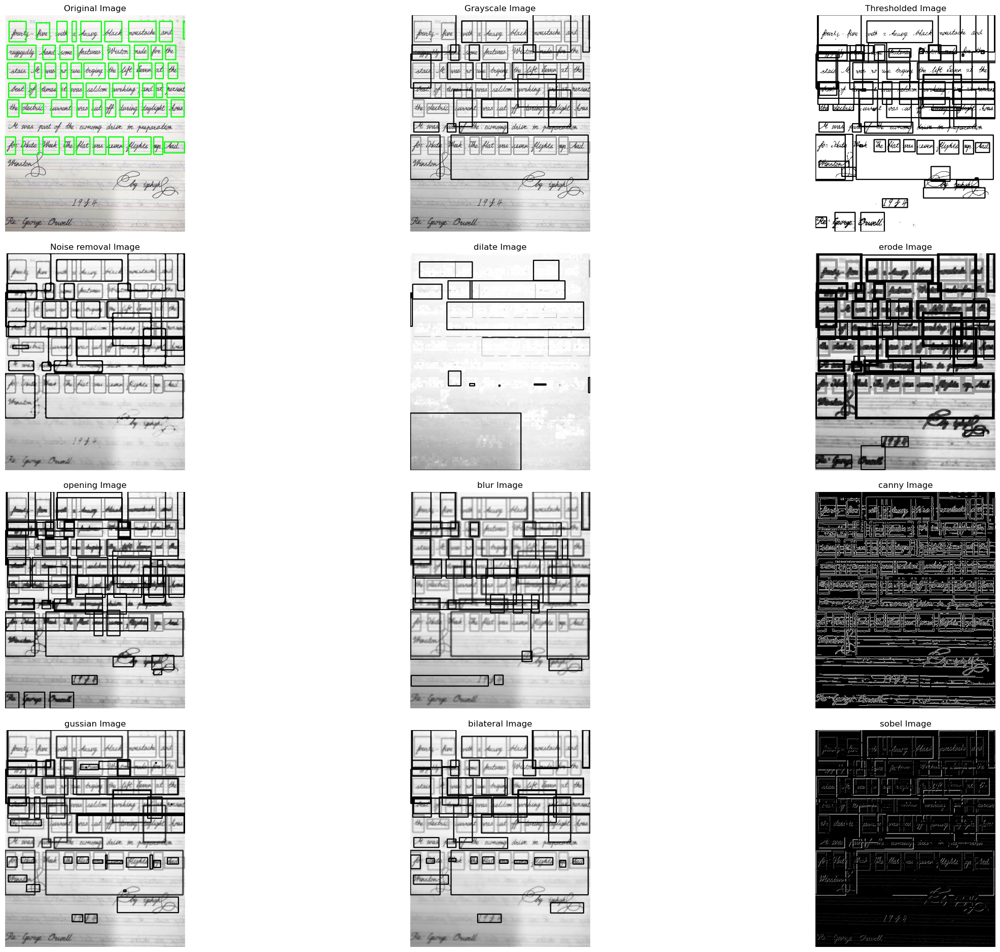

In [19]:
#cv2.imshow('img',drawbox(img_gray))
#cv2.waitKey(0)

#showimg(drawbox(img_gray))
#showimg(drawbox(img))
plt.figure(figsize=(30,30))
plt.subplot(531)
plt.title('Original Image')
showimg(drawbox(img))

plt.subplot(532)
plt.title('Grayscale Image')
img_gray = get_grayscale(img)
showimg(drawbox(img_gray))

plt.subplot(533)
plt.title('Thresholded Image')
img_thresh = thresholding(img_gray)
showimg(drawbox(img_thresh))

plt.subplot(534)
plt.title('Noise removal Image')
img_median = remove_noise(img_gray)
showimg(drawbox(img_median))

plt.subplot(535)
plt.title('dilate Image')
showimg(drawbox(dilate(img_gray)))

plt.subplot(536)
plt.title('erode Image')
showimg(drawbox(erode(img_gray)))

plt.subplot(537)
plt.title('opening Image')
showimg(drawbox(opening(img_gray)))

plt.subplot(538)
plt.title('blur Image')
showimg(drawbox(blur(img_gray)))

plt.subplot(539)
plt.title('canny Image')
showimg(drawbox(canny(img_gray)))

plt.subplot(5,3,10)
plt.title('gussian Image')
showimg(drawbox(gaussian(img_gray)))

plt.subplot(5,3,11)
plt.title('bilateral Image')
showimg(drawbox(bilateral(img_gray)))

plt.subplot(5,3,12)
plt.title('sobel Image')
showimg(drawbox(sobel(img_gray)))
plt.axis('off')

plt.subplots_adjust(hspace=0.1,wspace=0.1) 
plt.show()


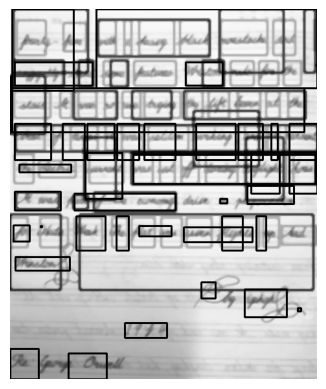

In [20]:
showimg(drawbox(remove_noise(gaussian(img_gray))))

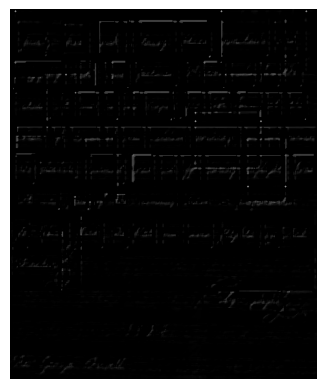

In [21]:
showimg(drawbox(remove_noise(sobel(img_gray))))

In [30]:
def drawboxword1(image):#draw box and text in the image 灰度图像黑线
    image = Image.fromarray(np.uint8(image))
    fontpath = 'NotoSansTC-Regular.ttf'          # Set font path
    font1 = ImageFont.truetype(fontpath, 14)
    draw = ImageDraw.Draw(image)
    custom_config = r'--oem 3 --psm 6'  # Configuration parameters, for specific options, please refer to the Tesseract documentation
    d = pytesseract.image_to_data(image,lang='eng+chi_tra' , config=custom_config,output_type=pytesseract.Output.DICT)
    n_boxes = len(d['level'])
    for i in range(n_boxes):
      (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
      text = d['text'][i]
      if text.strip() != '':
        draw.rectangle([x, y,x + w, y + h],fill = None,outline='blue', width=2)
        draw.text((x,y-18), text, font=font1, fill=0)#black
    #return image
    return np.asarray(image)

In [31]:
def drawboxword2(image):#draw box and text in the image 彩图用彩线
    image = Image.fromarray(np.uint8(image))
    fontpath = 'NotoSansTC-Regular.ttf'          # Set font path
    font1 = ImageFont.truetype(fontpath, 14)
    draw = ImageDraw.Draw(image)
    custom_config = r'--oem 3 --psm 6'  # Configuration parameters, for specific options, please refer to the Tesseract documentation
    d = pytesseract.image_to_data(image,lang='eng+chi_tra' , config=custom_config,output_type=pytesseract.Output.DICT)
    n_boxes = len(d['level'])
    for i in range(n_boxes):
      (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
      text = d['text'][i]
      if text.strip() != '':
        draw.rectangle([x, y,x + w, y + h],fill = None,outline='blue', width=2)
        draw.text((x,y-18), text, font=font1, fill=(255,0,0))#colorfull
    #return image
    return np.asarray(image)

In [32]:
def drawboxword3(image):#draw box and text in the image 边缘白字
    image = Image.fromarray(np.uint8(image))
    fontpath = 'NotoSansTC-Regular.ttf'          # Set font path
    font1 = ImageFont.truetype(fontpath, 14)
    draw = ImageDraw.Draw(image)
    custom_config = r'--oem 3 --psm 6'  # Configuration parameters, for specific options, please refer to the Tesseract documentation
    d = pytesseract.image_to_data(image,lang='eng+chi_tra' , config=custom_config,output_type=pytesseract.Output.DICT)
    n_boxes = len(d['level'])
    for i in range(n_boxes):
      (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
      text = d['text'][i]
      if text.strip() != '':
        draw.rectangle([x, y,x + w, y + h],fill = None,outline='blue', width=2)
        draw.text((x,y-18), text, font=font1, fill=255)#white
    #return image
    return np.asarray(image)

<>:2: SyntaxWarning: invalid escape sequence '\O'
<>:2: SyntaxWarning: invalid escape sequence '\O'
C:\Users\14926\AppData\Local\Temp\ipykernel_9696\763980473.py:2: SyntaxWarning: invalid escape sequence '\O'
  img1 = cv2.imread('.\OIP.jpg')


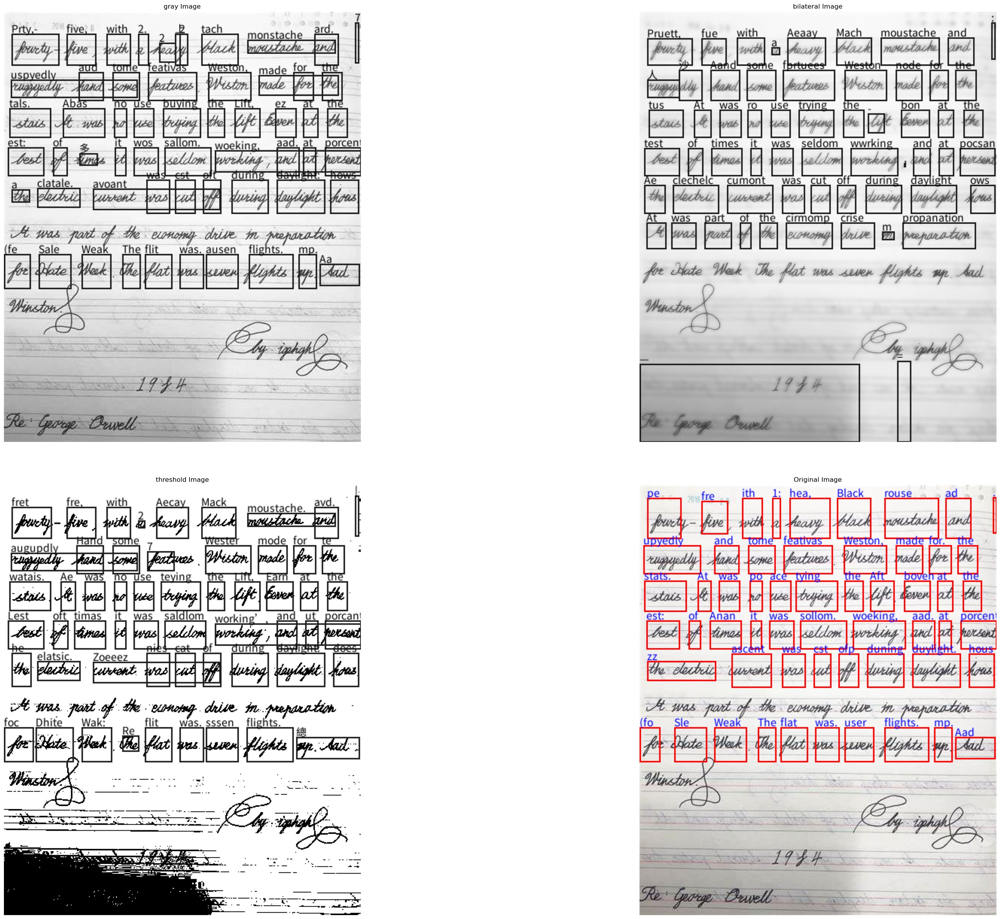

In [33]:
plt.figure(figsize=(40,30))
img1 = cv2.imread('.\OIP.jpg')

#image_array = np.asarray(img1)
img1_gray = get_grayscale(img1)
plt.subplot(2,2,1)
plt.title('gray Image')
showimg( drawboxword1((img1_gray)))

plt.subplot(2,2,2)
plt.title('bilateral Image')
showimg( drawboxword1((bilateral(img1_gray))))

plt.subplot(2,2,3)
plt.title('threshold Image')
showimg( drawboxword1((thresholding(img1_gray))))

plt.subplot(2,2,4)
plt.title('Original Image')
showimg( drawboxword2(img1))
plt.subplots_adjust(hspace=0.1,wspace=0.1) 
plt.show()

<>:2: SyntaxWarning: invalid escape sequence '\O'
<>:2: SyntaxWarning: invalid escape sequence '\O'
C:\Users\14926\AppData\Local\Temp\ipykernel_9696\127255454.py:2: SyntaxWarning: invalid escape sequence '\O'
  img1 = cv2.imread('.\OIP.jpg')


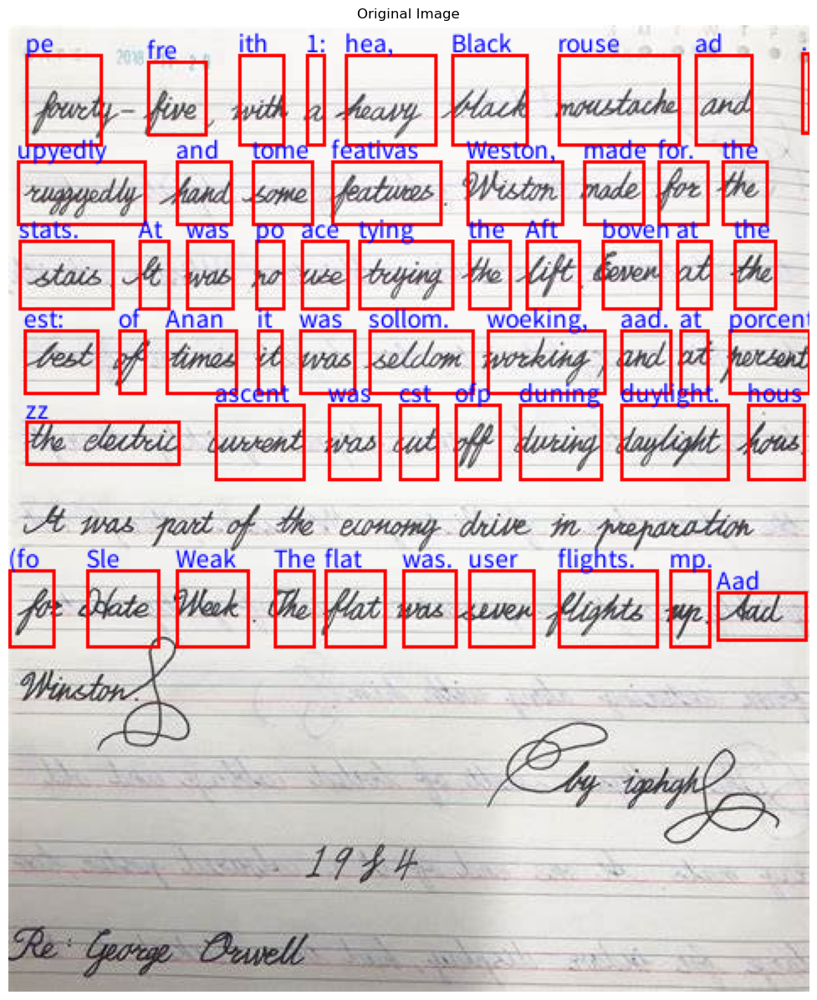

In [35]:
plt.figure(figsize=(15,15))
img1 = cv2.imread('.\OIP.jpg')
plt.title('Original Image')
showimg( drawboxword2(img1))
#plt.subplots_adjust(hspace=0.1,wspace=0.1) 
plt.show()

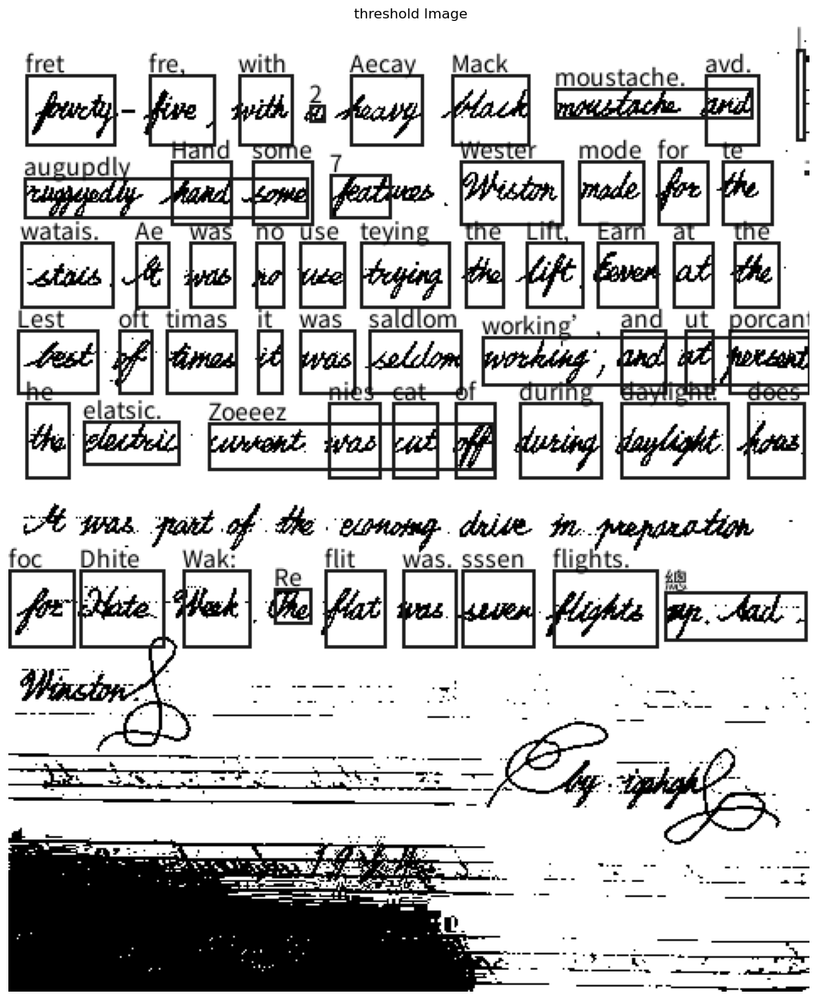

In [36]:
plt.figure(figsize=(15,15))
plt.title(' threshold Image')
showimg( drawboxword1((thresholding(img1_gray))))

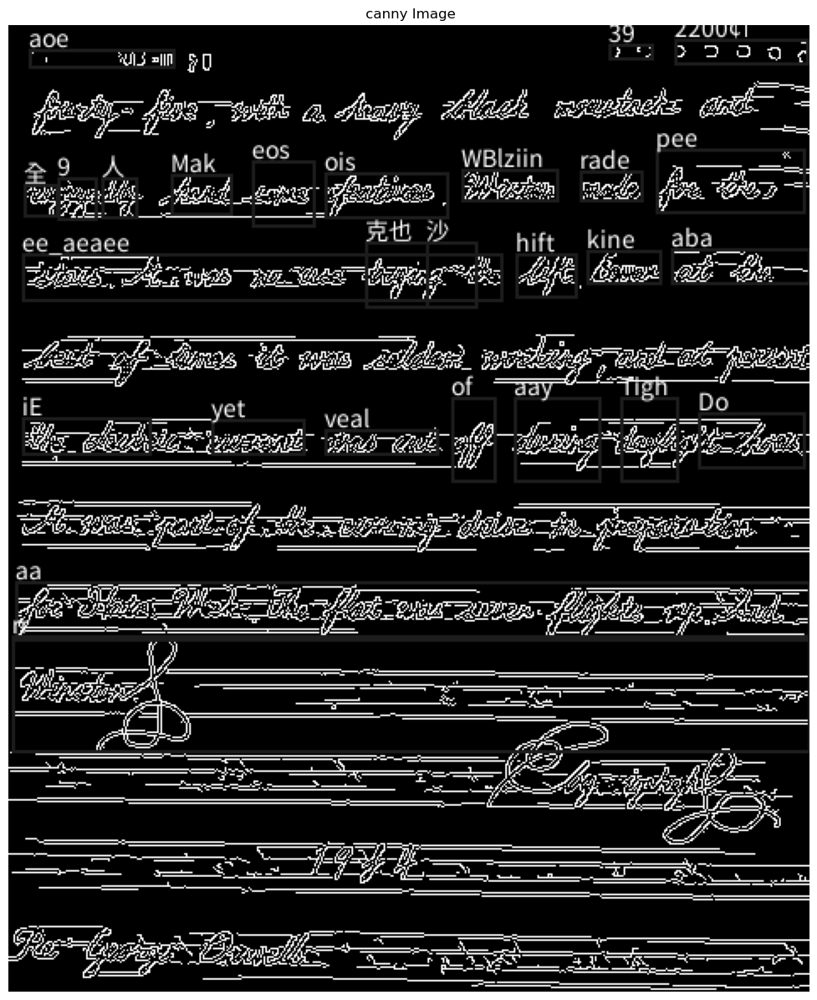

In [37]:
plt.figure(figsize=(15,15))
plt.title(' canny Image')
showimg( drawboxword3((canny(img1_gray))))

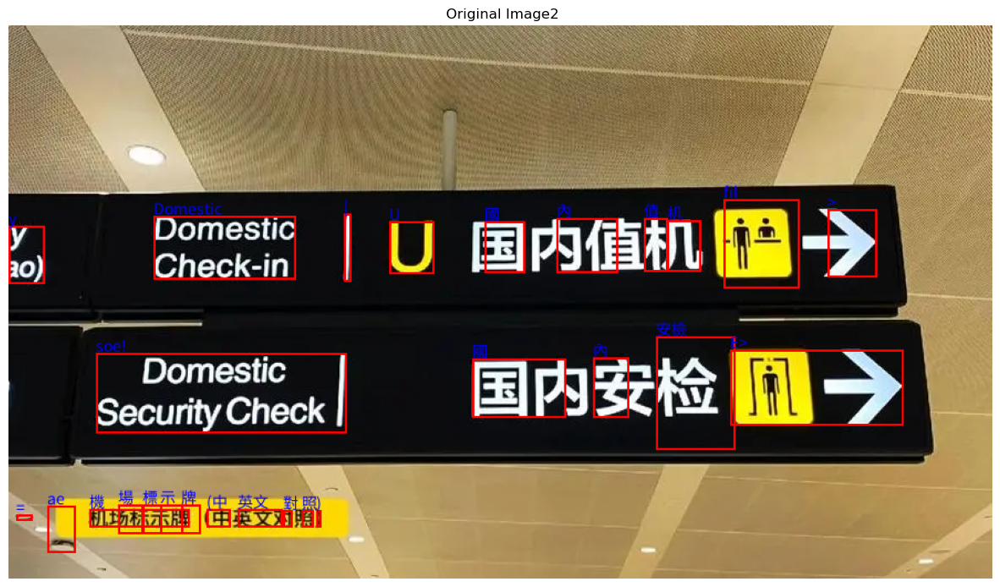

In [99]:
img2 = cv2.imread('./2.webp')

img2_gray = get_grayscale(img2)
plt.figure(figsize=(15,15))
plt.title(' Original Image2')
showimg( drawboxword2((img2)))

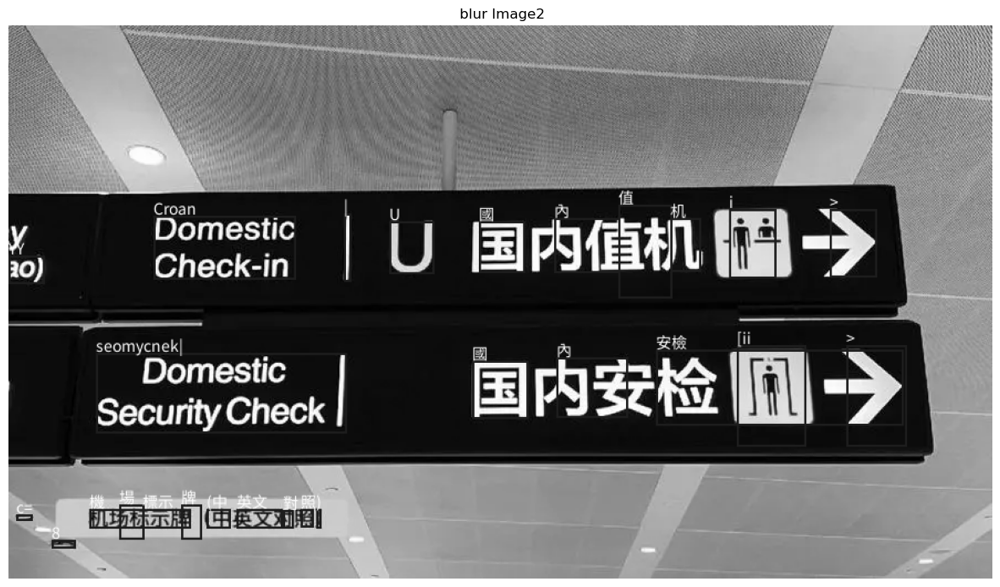

In [102]:
plt.figure(figsize=(15,15))
plt.title(' blur Image2')
showimg( drawboxword3((img2_gray)))

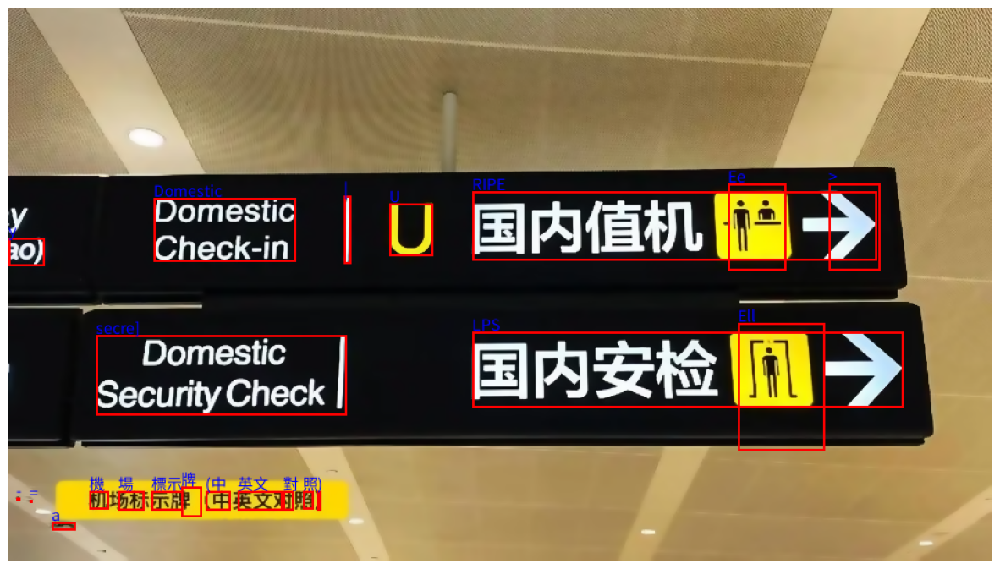

In [103]:
plt.figure(figsize=(15,15))
showimg( drawboxword2((bilateral(img2))))

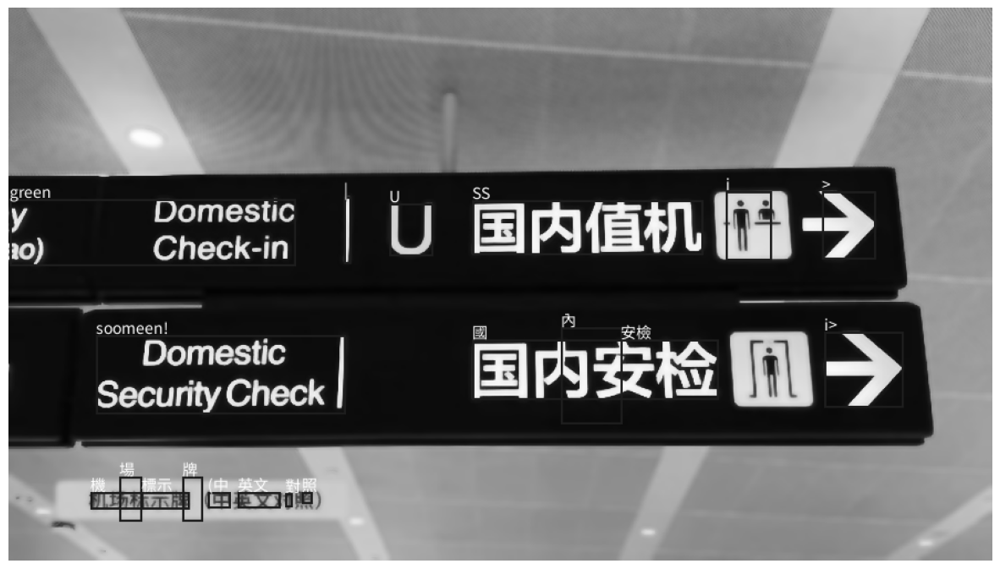

In [104]:
plt.figure(figsize=(15,15))
showimg(drawboxword3(bilateral(img2_gray)))

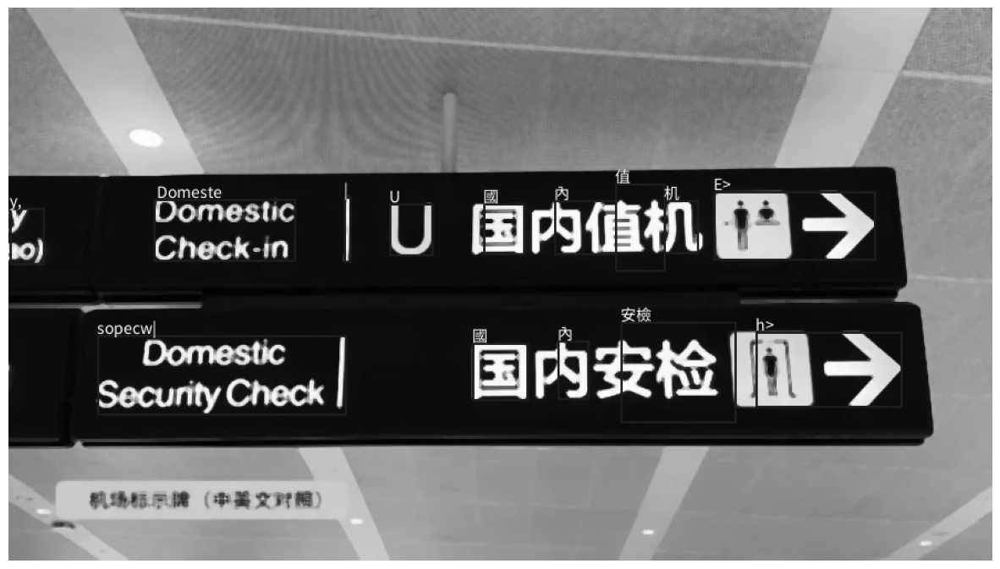

In [105]:
plt.figure(figsize=(15,15))
showimg(drawboxword3(remove_noise(img2_gray)))

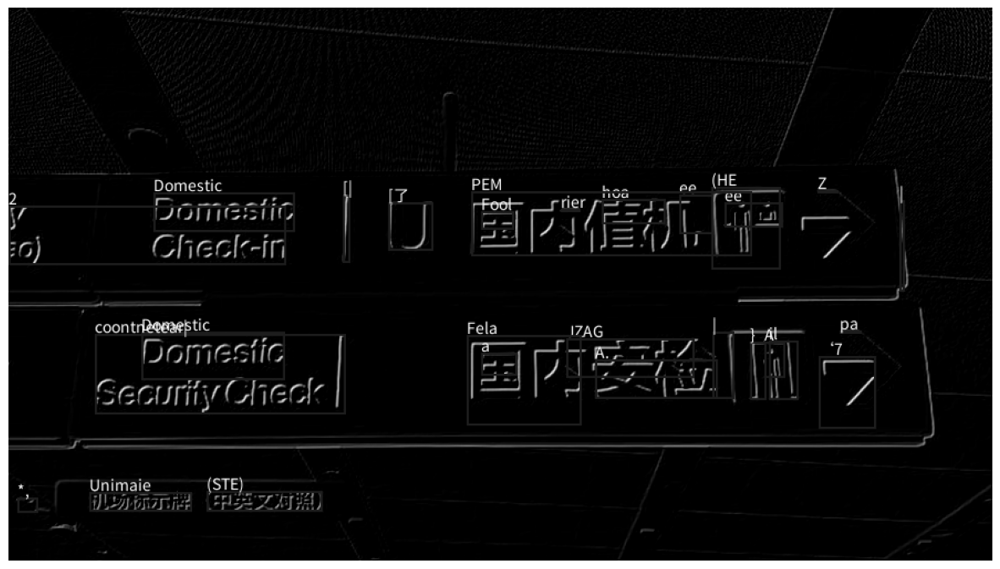

In [106]:
plt.figure(figsize=(15,15))
showimg(drawboxword3(sobel(img2_gray)))

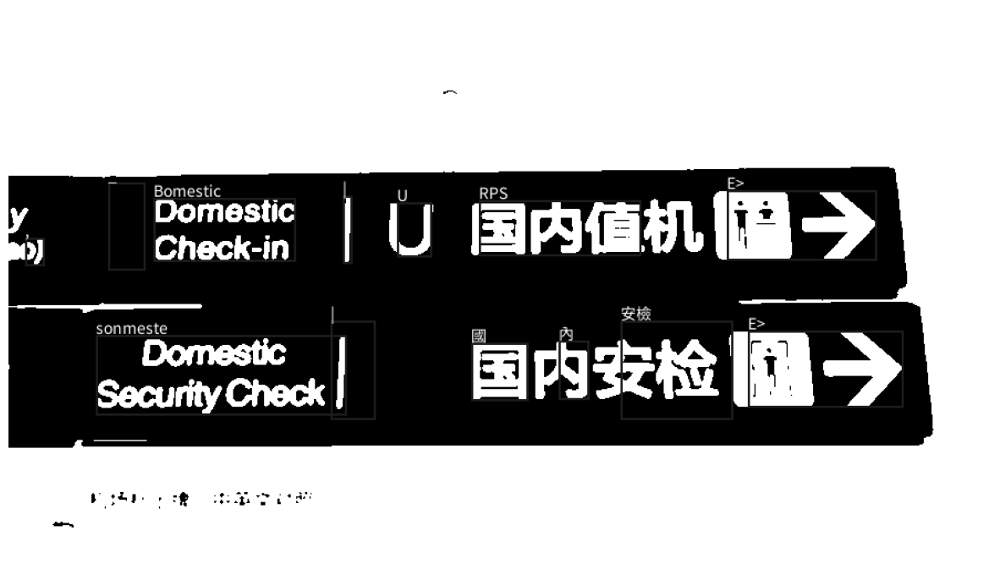

In [107]:
plt.figure(figsize=(15,15))
showimg(drawboxword3(thresholding(gaussian(img2_gray))))

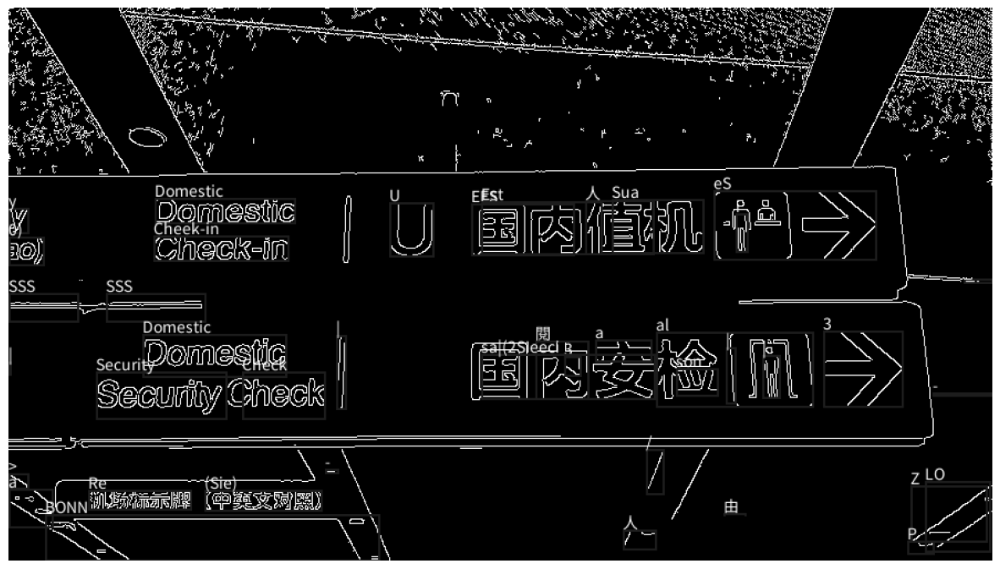

In [108]:
plt.figure(figsize=(15,15))
showimg(drawboxword3(canny(img2_gray)))

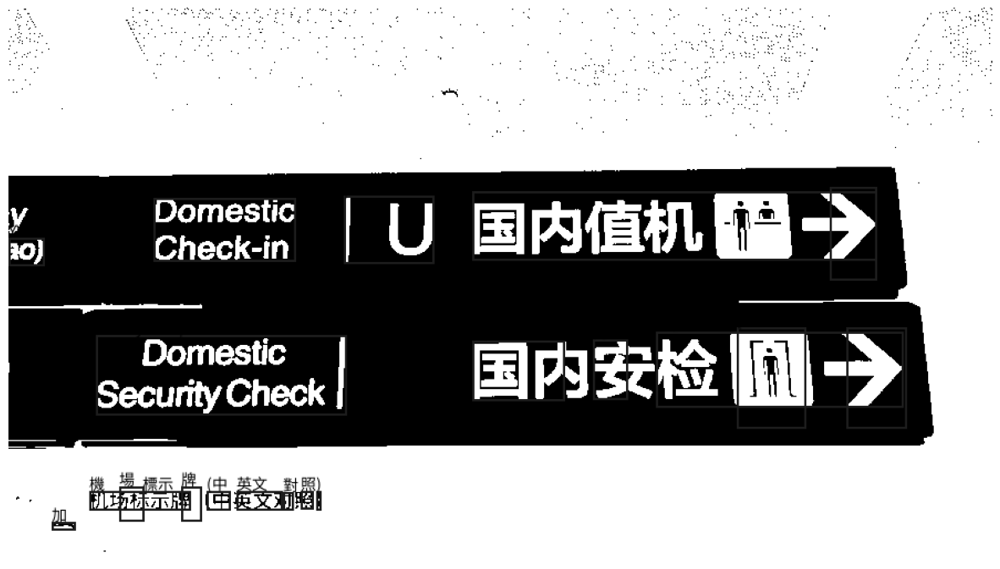

In [86]:
plt.figure(figsize=(15,15))
showimg(drawboxword1(thresholding(img2_gray)))

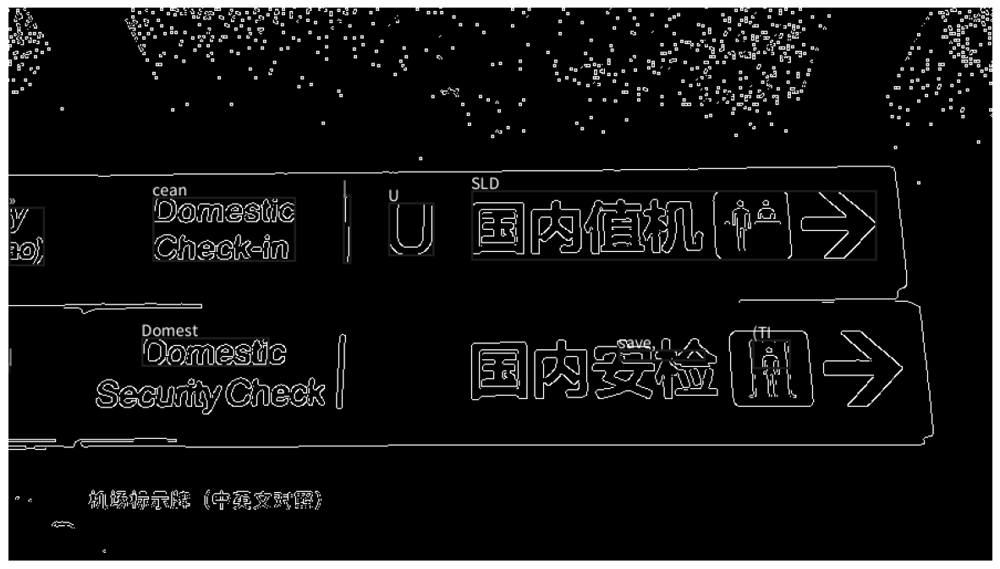

In [87]:
plt.figure(figsize=(15,15))
showimg(drawboxword3(canny(thresholding(img2_gray))))

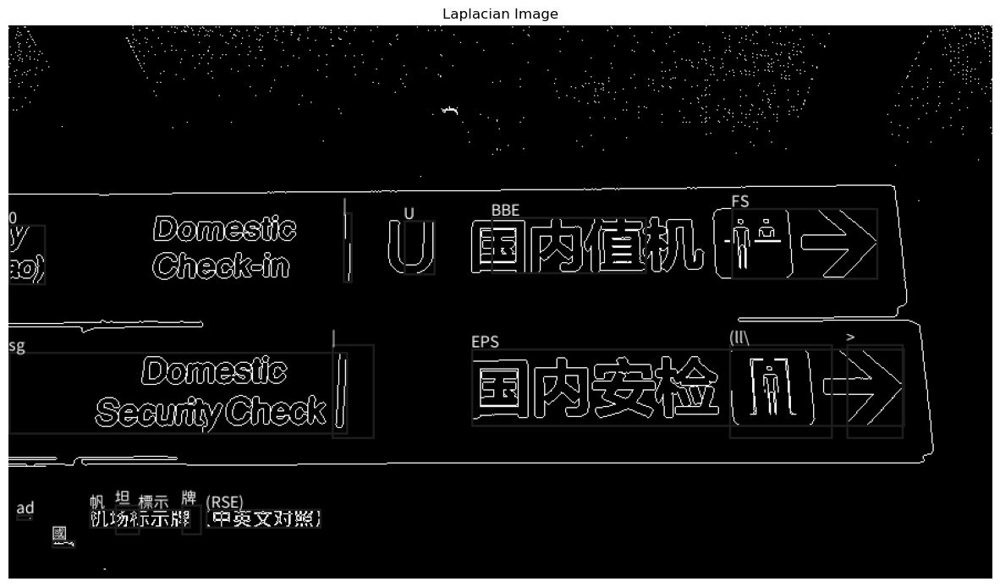

In [88]:
img4 = cv2.Laplacian(thresholding(img2_gray), cv2.CV_64F)
plt.figure(figsize=(15,15))
plt.title('Laplacian Image')
showimg( drawboxword3((img4)))

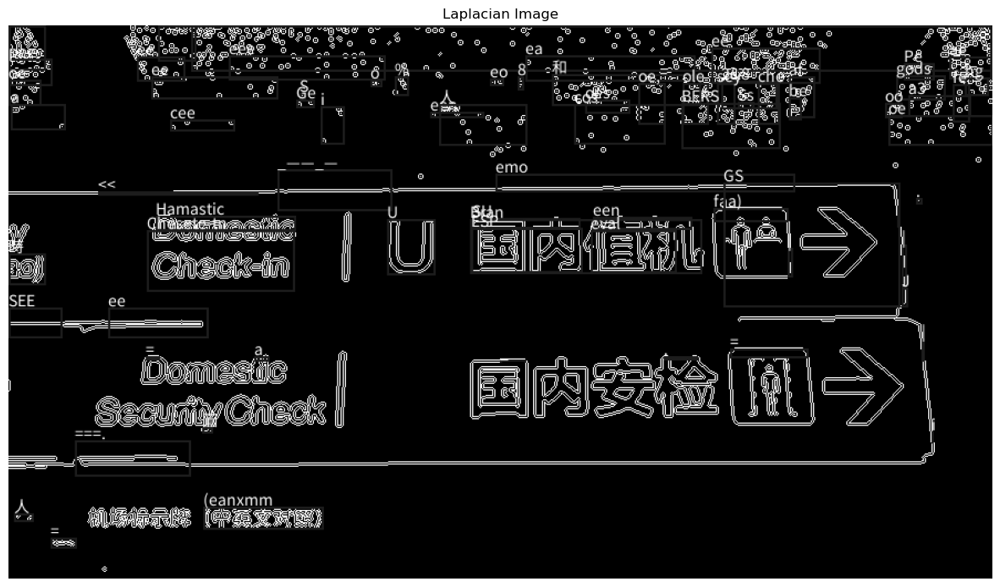

In [89]:
img5 = cv2.Laplacian(canny(thresholding(img2_gray)), cv2.CV_64F)
plt.figure(figsize=(15,15))
plt.title('Laplacian Image')
showimg( drawboxword3((img5)))